# Projet IMA Waterpiwels



In [229]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from collections import deque
import os

image = cv2.imread('lac.jpg')
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

In [230]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

def grey_image(image):
    if len(image.shape) == 3:  
        return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return image  

def gradient(image) : 
    gray = grey_image(image)  
    gray = gray.astype(np.uint8)

    grad = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, kernel)
    return grad

spacing = 100




In [231]:
def marqueurs_carre(height, width, spacing):
    Q = []
    for y in range(0, height, spacing):
        for x in range(0, width, spacing):
            Q.append([x + spacing // 2, y + spacing // 2])
    return Q

def marqueurs_hexagonaux(height, width, spacing):

    Q = []
    rapport = 2 / np.sqrt(3)  
    spacing_height = int(spacing * rapport)  

    for y in range(0, height, spacing):
        for x in range(0, width, spacing_height):
            if (y // spacing) % 2 == 0:  
                if 0 <= x < width and 0 <= y < height:
                    Q.append((x, y))
            else:  
                x_offset = x + spacing // 2
                if 0 <= x_offset < width and 0 <= y < height:
                    Q.append((x_offset, y))

    return Q


def distance_2 (X, Y):
    X, Y = np.array(X), np.array(Y)
    return np.sqrt(np.sum(np.square(X - Y)))

def distance_inf(X, Y):
    return max(abs(X[0] - Y[0]), abs(X[1] - Y[1]))

def distance_hex(X, Y):
    
    dx = X[0] - Y[0]  
    dy = X[1] - Y[1] 
    
    term1 = abs(dx)
    term2 = abs((np.sqrt(3) * dy + dx) / 2)
    term3 = abs((np.sqrt(3) * dy - dx) / 2)
    
    return max(term1, term2, term3)
    

### Dans un premier temps on se propose d'étudier les c-waterpixels. Ce sont des waterpixels dont le marqueurs sont définis par les centres des cellules. Ils sont moins complexes à implémenter que les m-waterpixels, que l'on verra juste après. 


# I On commence avec des marqueurs carrés

In [ ]:
# On calcule la transformation en distace de l'image 
def transfo_distance(image, distance):

    rows, cols = image.shape


    dist_transform = np.full_like(image, 255, dtype=np.float32)
    dist_transform[image == 0] = 0

    #  gauche à droite, haut vers bas
    for i in range(1, rows):
        for j in range(1, cols):
            if image[i, j] != 0:
                dist_transform[i, j] = min(
                    dist_transform[i, j],
                    distance((i, j), (i - 1, j)) + dist_transform[i - 1, j],
                    distance((i, j), (i, j - 1)) + dist_transform[i, j - 1])

    # droite à gauche, bas vers haut
    for i in range(rows - 2, -1, -1):
        for j in range(cols - 2, -1, -1):
            if image[i, j] != 0:
                dist_transform[i, j] = min(
                    dist_transform[i, j],
                    distance((i, j), (i + 1, j)) + dist_transform[i + 1, j],
                    distance((i, j), (i, j + 1)) + dist_transform[i, j + 1])

    return dist_transform


# Fonction gradient pour régularisation
def g_reg(k, gradient, celltype, spacing, distance ):
    reg_gradient = np.ones_like(gradient, dtype=np.float32)
    height, width = gradient.shape

    if celltype == 0:
        for x in range(0, height - spacing//2, spacing):
            for y in range(0, width - spacing//2, spacing):
                reg_gradient[x + spacing // 2, y + spacing // 2] = 0

        reg_gradient = np.array(reg_gradient)
        reg_gradient = reg_gradient.astype(np.uint8)
        dist_transform = transfo_distance(reg_gradient, distance)

    else:  

        Q = marqueurs_hexagonaux(height, width, spacing)
        for q in Q :
            reg_gradient[q[1],q[0]] =0

        reg_gradient = np.array(reg_gradient)
        reg_gradient = reg_gradient.astype(np.uint8)
        dist_transform = transfo_distance(reg_gradient, distance)

    reg_gradient = (2/spacing) * ( ( k * dist_transform )+ gradient)
    return reg_gradient

def waterpixels(image, k = 50, spacing = 50, celltype = 0, type ='carre' , distance = distance_inf):
    grad = gradient (image)

    height, width = grad.shape

    reg_image = g_reg(k, grad, celltype, spacing, distance)

    reg_image_normalized = cv2.normalize(reg_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    reg_image_normalized_color = cv2.cvtColor(reg_image_normalized, cv2.COLOR_GRAY2BGR)


    if type == 'carre':
        Q = marqueurs_carre(height, width, spacing)
        print('carre')
    elif type =='hexa' :
        Q = marqueurs_hexagonaux(height, width, spacing)
        print('hexa')
    else:
        raise ValueError(f"Type invalide : {type}. Utilisez  'carré' ou 1 'hexa'")

    if not Q:
        raise ValueError("La liste des marqueurs (Q) est vide. Vérifiez les paramètres d'entrée.")

    print(Q)

    markers = np.zeros((height, width), dtype=np.int32)

    for i, (x, y) in enumerate(Q):
        if 0 <= x < width and 0 <= y < height:
            markers[y, x] = i + 1 
    markers[0, :] = -1  
    markers[:, 0] = -1
    markers[-1, :] = -1
    markers[:, -1] = -1

    unique_markers = np.unique(markers)
    num_waterpixels = len(unique_markers) - 1  
    print("Nb de waterpixels", num_waterpixels)


    return cv2.watershed(reg_image_normalized_color, markers)


def show_waterpixels(image, k=1, spacing=50, celltype=0, type = 'carre', distance = distance_inf):
   
    image2 = image.copy()
    markers = waterpixels(image2, k, spacing, celltype, type, distance)

    if len(image2.shape) == 2:  
        image2 = cv2.cvtColor(image2, cv2.COLOR_GRAY2BGR)
    image2[markers == -1] = [0, 0, 255]  

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)) 
    plt.title(f"Image Segmentée avec c-watershed (k = {k})") 
    plt.axis('off')
    plt.show()

    return image2

show_waterpixels(image)


NameError: name 'distance_inf' is not defined

# II On passe aux marqueurs hexagonaux

### On affiche le gradient, le gradient régularisé, le marqueurs au centre des cellules, puis enfin l'image finale avec le watershed appliqué.

Type: <class 'numpy.ndarray'>, Shape: (1000, 1500), Dtype: uint8


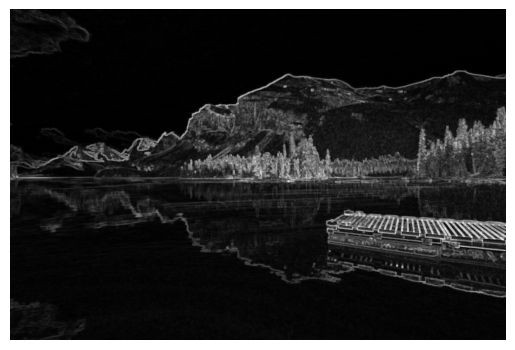

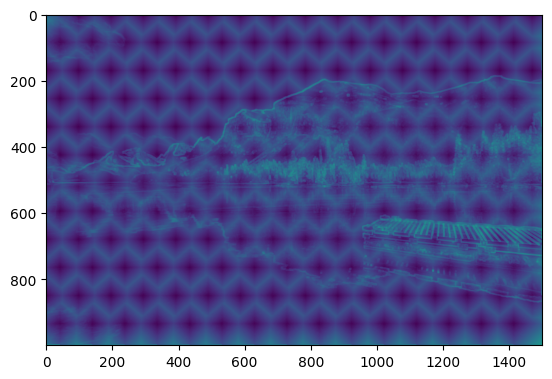

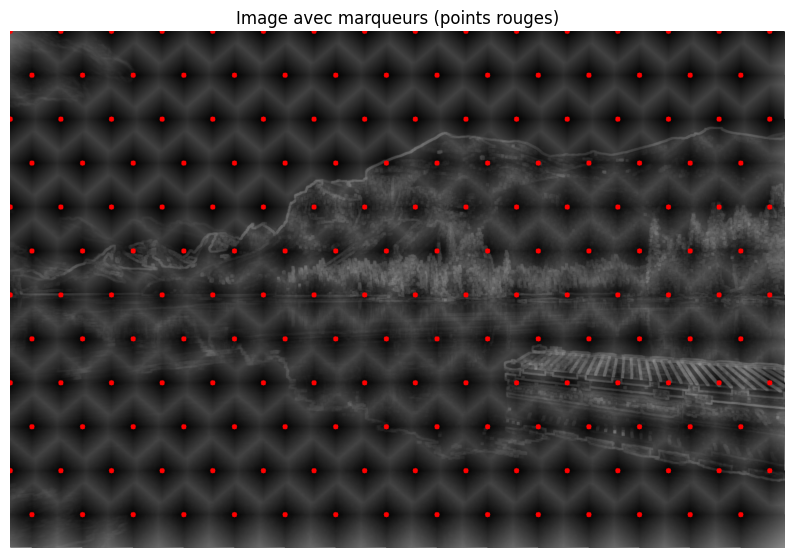

hexa
[(0, 0), (98, 0), (196, 0), (294, 0), (392, 0), (490, 0), (588, 0), (686, 0), (784, 0), (882, 0), (980, 0), (1078, 0), (1176, 0), (1274, 0), (1372, 0), (1470, 0), (42, 85), (140, 85), (238, 85), (336, 85), (434, 85), (532, 85), (630, 85), (728, 85), (826, 85), (924, 85), (1022, 85), (1120, 85), (1218, 85), (1316, 85), (1414, 85), (0, 170), (98, 170), (196, 170), (294, 170), (392, 170), (490, 170), (588, 170), (686, 170), (784, 170), (882, 170), (980, 170), (1078, 170), (1176, 170), (1274, 170), (1372, 170), (1470, 170), (42, 255), (140, 255), (238, 255), (336, 255), (434, 255), (532, 255), (630, 255), (728, 255), (826, 255), (924, 255), (1022, 255), (1120, 255), (1218, 255), (1316, 255), (1414, 255), (0, 340), (98, 340), (196, 340), (294, 340), (392, 340), (490, 340), (588, 340), (686, 340), (784, 340), (882, 340), (980, 340), (1078, 340), (1176, 340), (1274, 340), (1372, 340), (1470, 340), (42, 425), (140, 425), (238, 425), (336, 425), (434, 425), (532, 425), (630, 425), (728, 42

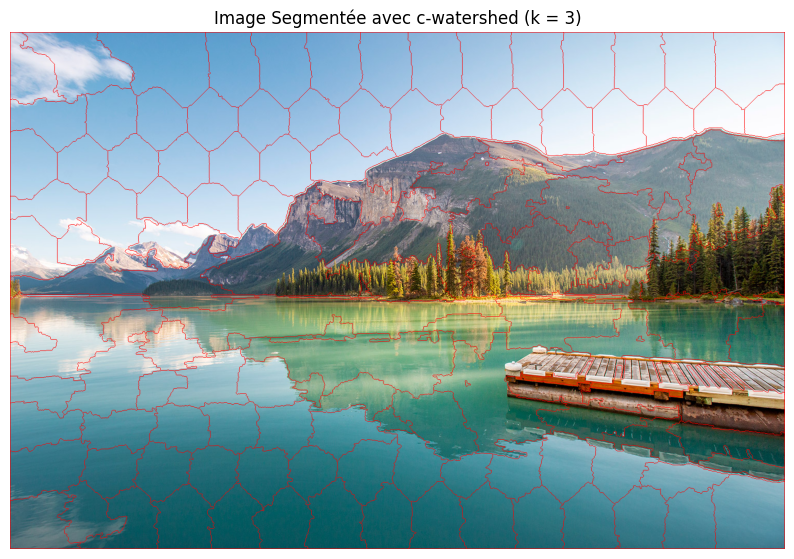

True

In [233]:
grad0 = gradient(image)
distance0 = distance_hex
celltype0 = 1
spacing85 = 85
k5 =5
height,width = grad0.shape[:]
Q = marqueurs_hexagonaux(height, width, spacing85)

def show_markers_on_image(image, markers):
    
    if len(image.shape) == 2:  
        image_with_markers = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)  
    else:
        image_with_markers = image.copy()  

    
    for marker in markers:
        if len(marker) == 2:  
            j, i = marker  
            cv2.circle(image_with_markers, (j, i), 5, (0, 0, 255), -1) 

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_markers, cv2.COLOR_BGR2RGB))    
    plt.axis('off')
    plt.show()

    return cv2.cvtColor(image_with_markers, cv2.COLOR_BGR2RGB)


image2 = gradient(image)

#pour débuguer
print(f"Type: {type(image2)}, Shape: {image2.shape}, Dtype: {image2.dtype}")

if image2 is None or image2.size == 0:
    raise ValueError("Gradient image data is invalid or empty.")

if image2.dtype != "uint8":
    image2 = (255 * image2 / image2.max()).astype("uint8")


plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


reg_image = g_reg(3, grad0, celltype0, spacing85, distance0)

reg_image_normalized = cv2.normalize(reg_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


image_marker = show_markers_on_image(reg_image_normalized,Q)
image_marker= cv2.cvtColor(image_marker, cv2.COLOR_BGR2RGB)



image3 = show_waterpixels(image, 3, spacing85, celltype=1, type = 'hexa', distance = distance_inf)



# Comparaison des cellules heagonales et des cellules carrées

### On affiche les contours obtenus pas watershed en partant des cellules hexagoneales et des cellules carrés.

hexa
[(0, 0), (57, 0), (114, 0), (171, 0), (228, 0), (285, 0), (342, 0), (399, 0), (456, 0), (513, 0), (570, 0), (627, 0), (684, 0), (741, 0), (798, 0), (855, 0), (912, 0), (969, 0), (1026, 0), (1083, 0), (1140, 0), (1197, 0), (25, 50), (82, 50), (139, 50), (196, 50), (253, 50), (310, 50), (367, 50), (424, 50), (481, 50), (538, 50), (595, 50), (652, 50), (709, 50), (766, 50), (823, 50), (880, 50), (937, 50), (994, 50), (1051, 50), (1108, 50), (1165, 50), (0, 100), (57, 100), (114, 100), (171, 100), (228, 100), (285, 100), (342, 100), (399, 100), (456, 100), (513, 100), (570, 100), (627, 100), (684, 100), (741, 100), (798, 100), (855, 100), (912, 100), (969, 100), (1026, 100), (1083, 100), (1140, 100), (1197, 100), (25, 150), (82, 150), (139, 150), (196, 150), (253, 150), (310, 150), (367, 150), (424, 150), (481, 150), (538, 150), (595, 150), (652, 150), (709, 150), (766, 150), (823, 150), (880, 150), (937, 150), (994, 150), (1051, 150), (1108, 150), (1165, 150), (0, 200), (57, 200), (1

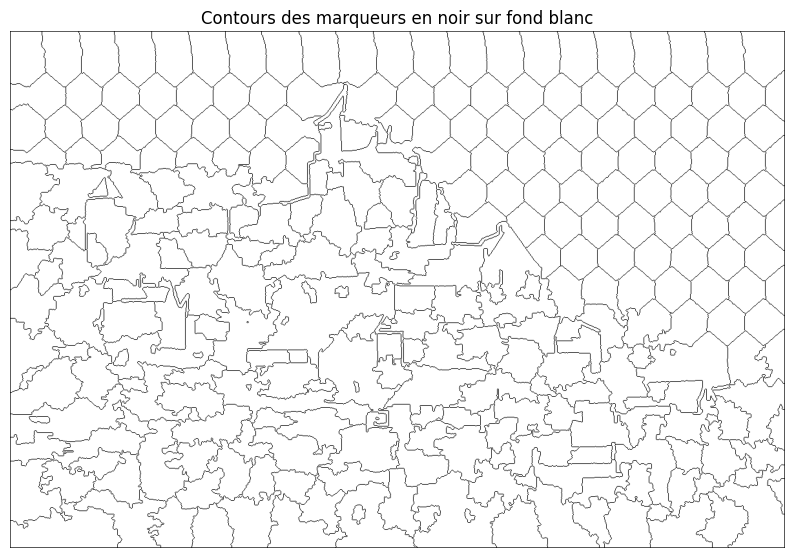

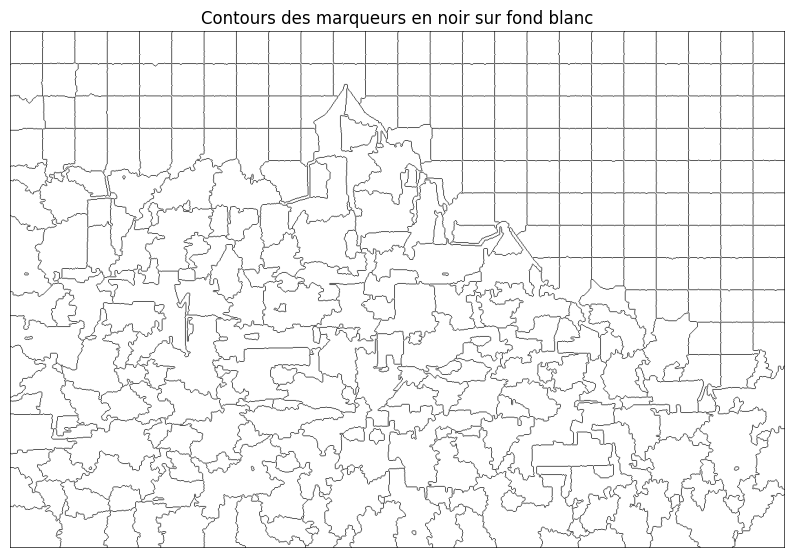

In [257]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def contours(markers, image):
   
    
    height, width = image.shape[:2]
    image2 = np.ones((height, width, 3), dtype=np.uint8) * 255  

    if len(image2.shape) == 2:
        image2 = cv2.cvtColor(image2, cv2.COLOR_GRAY2BGR)

    image2[markers == -1] = [0, 0, 0]  

    # Afficher l'image des marqueurs
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)) 
    plt.title("Contours des marqueurs en noir sur fond blanc")
    plt.axis('off')
    plt.show()

    return image2

image = cv2.imread("village.jpg")

markers = waterpixels(image, k=8, spacing=50, celltype=1, type='hexa', distance=distance_hex)
markers2 = waterpixels(image, k=8, spacing=50, celltype=0, type='carre', distance=distance_inf)

border_image = contours(markers, image)
border_image2 = contours(markers2, image)


### On remarque qu'il est difficile de comparer ces 2 segmentations juste avec leur watershed.

# Évolution du paramètre k pour spacing = 85

hexa
[(0, 0), (92, 0), (184, 0), (276, 0), (368, 0), (460, 0), (552, 0), (644, 0), (736, 0), (828, 0), (920, 0), (1012, 0), (1104, 0), (1196, 0), (1288, 0), (1380, 0), (1472, 0), (1564, 0), (1656, 0), (1748, 0), (1840, 0), (40, 80), (132, 80), (224, 80), (316, 80), (408, 80), (500, 80), (592, 80), (684, 80), (776, 80), (868, 80), (960, 80), (1052, 80), (1144, 80), (1236, 80), (1328, 80), (1420, 80), (1512, 80), (1604, 80), (1696, 80), (1788, 80), (1880, 80), (0, 160), (92, 160), (184, 160), (276, 160), (368, 160), (460, 160), (552, 160), (644, 160), (736, 160), (828, 160), (920, 160), (1012, 160), (1104, 160), (1196, 160), (1288, 160), (1380, 160), (1472, 160), (1564, 160), (1656, 160), (1748, 160), (1840, 160), (40, 240), (132, 240), (224, 240), (316, 240), (408, 240), (500, 240), (592, 240), (684, 240), (776, 240), (868, 240), (960, 240), (1052, 240), (1144, 240), (1236, 240), (1328, 240), (1420, 240), (1512, 240), (1604, 240), (1696, 240), (1788, 240), (1880, 240), (0, 320), (92, 32

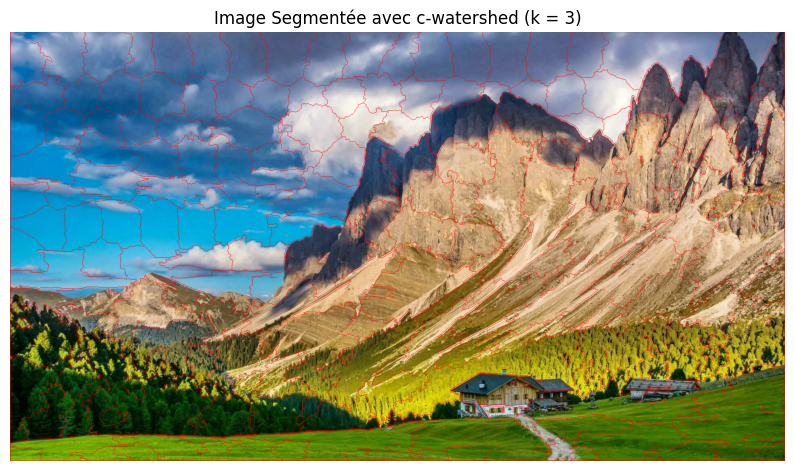

hexa
[(0, 0), (92, 0), (184, 0), (276, 0), (368, 0), (460, 0), (552, 0), (644, 0), (736, 0), (828, 0), (920, 0), (1012, 0), (1104, 0), (1196, 0), (1288, 0), (1380, 0), (1472, 0), (1564, 0), (1656, 0), (1748, 0), (1840, 0), (40, 80), (132, 80), (224, 80), (316, 80), (408, 80), (500, 80), (592, 80), (684, 80), (776, 80), (868, 80), (960, 80), (1052, 80), (1144, 80), (1236, 80), (1328, 80), (1420, 80), (1512, 80), (1604, 80), (1696, 80), (1788, 80), (1880, 80), (0, 160), (92, 160), (184, 160), (276, 160), (368, 160), (460, 160), (552, 160), (644, 160), (736, 160), (828, 160), (920, 160), (1012, 160), (1104, 160), (1196, 160), (1288, 160), (1380, 160), (1472, 160), (1564, 160), (1656, 160), (1748, 160), (1840, 160), (40, 240), (132, 240), (224, 240), (316, 240), (408, 240), (500, 240), (592, 240), (684, 240), (776, 240), (868, 240), (960, 240), (1052, 240), (1144, 240), (1236, 240), (1328, 240), (1420, 240), (1512, 240), (1604, 240), (1696, 240), (1788, 240), (1880, 240), (0, 320), (92, 32

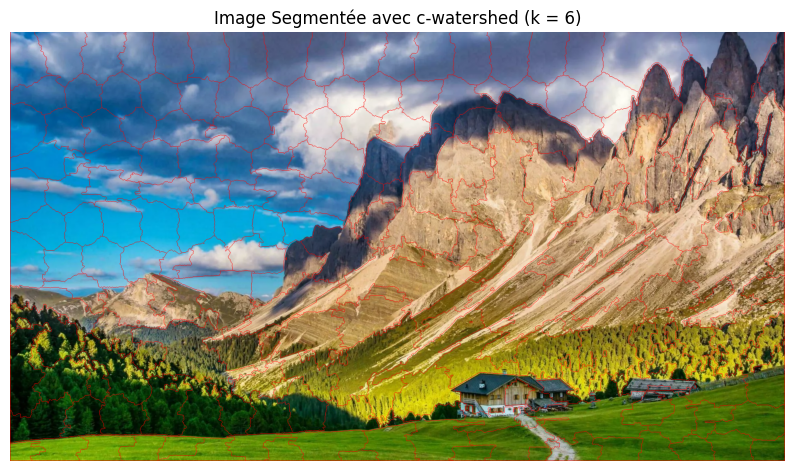

hexa
[(0, 0), (92, 0), (184, 0), (276, 0), (368, 0), (460, 0), (552, 0), (644, 0), (736, 0), (828, 0), (920, 0), (1012, 0), (1104, 0), (1196, 0), (1288, 0), (1380, 0), (1472, 0), (1564, 0), (1656, 0), (1748, 0), (1840, 0), (40, 80), (132, 80), (224, 80), (316, 80), (408, 80), (500, 80), (592, 80), (684, 80), (776, 80), (868, 80), (960, 80), (1052, 80), (1144, 80), (1236, 80), (1328, 80), (1420, 80), (1512, 80), (1604, 80), (1696, 80), (1788, 80), (1880, 80), (0, 160), (92, 160), (184, 160), (276, 160), (368, 160), (460, 160), (552, 160), (644, 160), (736, 160), (828, 160), (920, 160), (1012, 160), (1104, 160), (1196, 160), (1288, 160), (1380, 160), (1472, 160), (1564, 160), (1656, 160), (1748, 160), (1840, 160), (40, 240), (132, 240), (224, 240), (316, 240), (408, 240), (500, 240), (592, 240), (684, 240), (776, 240), (868, 240), (960, 240), (1052, 240), (1144, 240), (1236, 240), (1328, 240), (1420, 240), (1512, 240), (1604, 240), (1696, 240), (1788, 240), (1880, 240), (0, 320), (92, 32

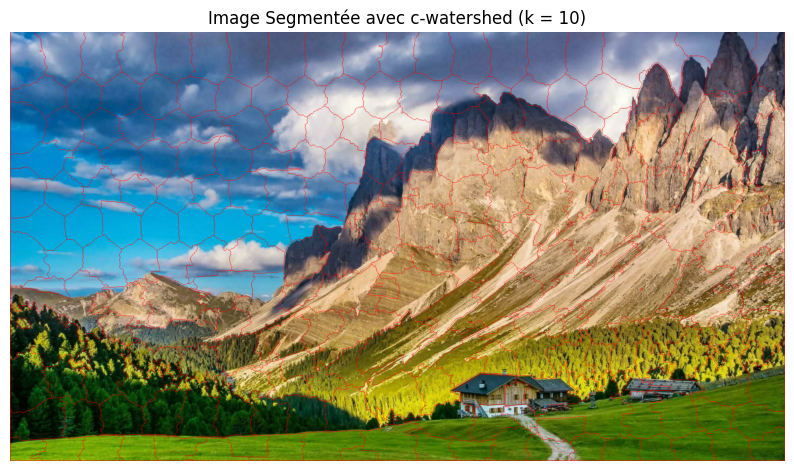

hexa
[(0, 0), (92, 0), (184, 0), (276, 0), (368, 0), (460, 0), (552, 0), (644, 0), (736, 0), (828, 0), (920, 0), (1012, 0), (1104, 0), (1196, 0), (1288, 0), (1380, 0), (1472, 0), (1564, 0), (1656, 0), (1748, 0), (1840, 0), (40, 80), (132, 80), (224, 80), (316, 80), (408, 80), (500, 80), (592, 80), (684, 80), (776, 80), (868, 80), (960, 80), (1052, 80), (1144, 80), (1236, 80), (1328, 80), (1420, 80), (1512, 80), (1604, 80), (1696, 80), (1788, 80), (1880, 80), (0, 160), (92, 160), (184, 160), (276, 160), (368, 160), (460, 160), (552, 160), (644, 160), (736, 160), (828, 160), (920, 160), (1012, 160), (1104, 160), (1196, 160), (1288, 160), (1380, 160), (1472, 160), (1564, 160), (1656, 160), (1748, 160), (1840, 160), (40, 240), (132, 240), (224, 240), (316, 240), (408, 240), (500, 240), (592, 240), (684, 240), (776, 240), (868, 240), (960, 240), (1052, 240), (1144, 240), (1236, 240), (1328, 240), (1420, 240), (1512, 240), (1604, 240), (1696, 240), (1788, 240), (1880, 240), (0, 320), (92, 32

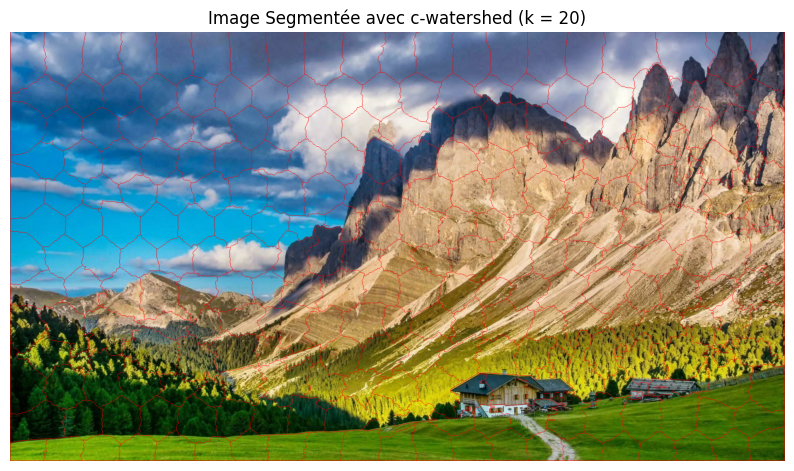

hexa
[(0, 0), (92, 0), (184, 0), (276, 0), (368, 0), (460, 0), (552, 0), (644, 0), (736, 0), (828, 0), (920, 0), (1012, 0), (1104, 0), (1196, 0), (1288, 0), (1380, 0), (1472, 0), (1564, 0), (1656, 0), (1748, 0), (1840, 0), (40, 80), (132, 80), (224, 80), (316, 80), (408, 80), (500, 80), (592, 80), (684, 80), (776, 80), (868, 80), (960, 80), (1052, 80), (1144, 80), (1236, 80), (1328, 80), (1420, 80), (1512, 80), (1604, 80), (1696, 80), (1788, 80), (1880, 80), (0, 160), (92, 160), (184, 160), (276, 160), (368, 160), (460, 160), (552, 160), (644, 160), (736, 160), (828, 160), (920, 160), (1012, 160), (1104, 160), (1196, 160), (1288, 160), (1380, 160), (1472, 160), (1564, 160), (1656, 160), (1748, 160), (1840, 160), (40, 240), (132, 240), (224, 240), (316, 240), (408, 240), (500, 240), (592, 240), (684, 240), (776, 240), (868, 240), (960, 240), (1052, 240), (1144, 240), (1236, 240), (1328, 240), (1420, 240), (1512, 240), (1604, 240), (1696, 240), (1788, 240), (1880, 240), (0, 320), (92, 32

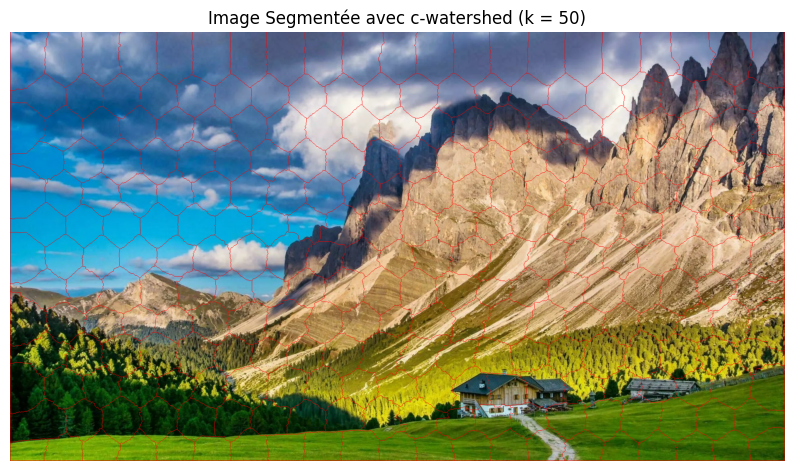

In [251]:
image = cv2.imread("montagne.webp")
distance0 = distance_inf
celltype0 = 0
spacing0 = 80

K = [3,6,10,20,50]

for k in K : 
    image2 = show_waterpixels(image, k, spacing0, 0, 'hexa', distance_hex)

# III Passage aux m-waterpixels

### Les m-waterpixels sont différents des c-waterpixels. On garde le cas des cellules hexagonales, les nouveux marqueurs ne sont plus les centres des cellules mais le barrycentre de la plus grande surface de minnimum de gradient par cellule.


In [243]:
image = cv2.imread("savane.jpg")
height, width = image.shape[:2]

#on définit un lot de fonctions dont on aura besoin par la suite

def barrycentre(L):
    assert len(L) != 0  
    barry = [0, 0]  
    n = len(L)
    
    for elem in L:
        barry[0] += elem[0]
        barry[1] += elem[1]
    
    barry[0] = (1 / n) * barry[0]
    barry[1] = (1 / n) * barry[1]

    return [int(barry[0]), int(barry[1])]

def bfs(image, mask, start, threshold, visited):
    queue = deque([start])
    component = []
    visited.add(start)
    grad = gradient(image)

    height, width = grad.shape

    directions = [(-1, 0), (1, 0), (0, -1), (0, 1)]

    while queue:
        x, y = queue.popleft()
        component.append((x, y))

        for dx, dy in directions:
            nx, ny = x + dx, y + dy

            if 0 <= nx < width and 0 <= ny < height and (nx, ny) not in visited:
                if mask[ny, nx] == 1 and grad[ny, nx] <= threshold:
                    visited.add((nx, ny))
                    queue.append((nx, ny))

    return component

def zone_gradient_minimal(image, liste):
    grad = gradient(image)
    height, width = grad.shape


    mask = np.zeros(image.shape[:2], dtype=np.uint8)
    for elem in liste:
        i, j = elem
        if 0 <= i < width and 0 <= j < height :
            mask[j, i] = 1  

    threshold = np.percentile(grad, 10)  

    visited = set()

    components = []

    for i, j in liste:
        if (i, j) not in visited:
            component = bfs(grad, mask, (i, j), threshold, visited)
            components.append(component)

    largest_component = max(components, key=len)


    return largest_component

def cellule_hexagonale(image, spacing, marker):

    cellule = []
    i, j = marker
    height, width = image.shape[:2]  

    for x in range(i+int(-spacing/2), i+int(spacing/2) + 1):  
        for y in range(j+int(-spacing/2), j+int(spacing/2) + 1):
            if distance_hex([x, y], [i,j]) <= spacing /2 :

                
                if 0 <= x < width and 0 <= y < height:
                    cellule.append([x, y])

    if len(cellule) == 0:
        print(f"Cellule hexagonale vide à {marker}")
    
    return np.array(cellule)


def zones_hexagones(image, spacing):

    height, width = image.shape[:2]

    centers = marqueurs_hexagonaux(height, width, spacing)

    hexagones = []

    for center in centers:
        zone = cellule_hexagonale(image, spacing, center)
        hexagones.append(zone)

    return hexagones



def m_markers_hexa(image, spacing):
    print("Début du calcul des marqueurs...")
    grad_image = gradient(image)
    c_markers = []
    hexa_zones = zones_hexagones(grad_image, spacing)
    print(f"Nombre d'hexagones : {len(hexa_zones)}")

    for hexa in hexa_zones :
        zone = zone_gradient_minimal(image,hexa)
        marker = barrycentre(zone)
        c_markers.append(marker)

    return c_markers

print(m_markers_hexa(image, 25))
height, width = image.shape[:2]
        

Début du calcul des marqueurs...
Nombre d'hexagones : 376
[[2, 6], [34, 3], [46, 5], [85, 3], [108, 4], [139, 8], [174, 5], [185, 1], [226, 3], [247, 4], [274, 2], [308, 6], [338, 0], [361, 4], [397, 4], [415, 1], [454, 5], [472, 5], [509, 4], [531, 3], [553, 5], [592, 1], [615, 4], [640, 2], [14, 21], [40, 14], [59, 26], [93, 29], [115, 30], [149, 20], [179, 24], [206, 15], [233, 27], [261, 28], [291, 25], [313, 19], [353, 21], [371, 21], [398, 29], [431, 25], [460, 22], [489, 18], [520, 19], [542, 23], [578, 18], [592, 22], [623, 20], [11, 48], [21, 46], [56, 55], [85, 51], [111, 49], [135, 47], [167, 47], [194, 46], [231, 53], [246, 47], [274, 43], [300, 52], [333, 45], [364, 42], [390, 44], [421, 46], [451, 46], [468, 56], [509, 52], [534, 55], [560, 54], [588, 49], [616, 50], [640, 47], [12, 78], [38, 75], [66, 73], [87, 77], [114, 77], [156, 66], [182, 81], [198, 74], [228, 80], [259, 66], [293, 73], [318, 78], [350, 84], [376, 71], [410, 66], [428, 78], [464, 74], [494, 82], [51

### On définit maintenant les fonctions pour obtenir les waterpixels ey les afficher à partir des fonctions précédentes.

In [216]:


height, width = image.shape[:2]

def m_waterpixels(image, k = 50, spacing = 50, celltype = 1, distance = distance_hex):
    grad = gradient (image)

    height, width = grad.shape

    reg_image = g_reg(k, grad, celltype, spacing, distance)

    reg_image_normalized = cv2.normalize(reg_image, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    reg_image_normalized_color = cv2.cvtColor(reg_image_normalized, cv2.COLOR_GRAY2BGR)


    Q = m_markers_hexa(image, spacing)

    if not Q:
        raise ValueError("La liste des marqueurs (Q) est vide. Vérifiez les paramètres d'entrée.")
    
    markers = np.zeros((height, width), dtype=np.int32)
    
    for i, (x, y) in enumerate(Q):
        x, y = int(x), int(y)  
        
        if 0 <= x < width and 0 <= y < height:
            markers[y, x] = i + 1  
        else:
            print(f"Coordonnées invalides pour le marqueur {i}: ({x}, {y})")

    show_markers_on_image(image, markers)


    markers[0, :] = -1  
    markers[:, 0] = -1
    markers[-1, :] = -1
    markers[:, -1] = -1

    return cv2.watershed(reg_image_normalized_color, markers)


def show_m_waterpixels(image, k=8, spacing=50, celltype=1, distance = distance_hex,thickness=3):
    
    image2 = image.copy()
    markers = m_waterpixels(image2, k, spacing, celltype, distance)
    
    if len(image2.shape) == 2:  
        image2 = cv2.cvtColor(image2, cv2.COLOR_GRAY2BGR)

    boundaries = (markers == -1).astype(np.uint8)  
    boundaries = cv2.dilate(boundaries, np.ones((thickness, thickness), dtype=np.uint8), iterations=1)

    image2[boundaries > 0] = [0, 0, 255]  

    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)) 
    plt.title("Image Segmentée avec Watershed")
    plt.axis('off')
    plt.show()

def show_markers_on_image(image, markers):
    
    if len(image.shape) == 2:  
        image_with_markers = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)  
    else:
        image_with_markers = image.copy()  

    
    for marker in markers:
        if len(marker) == 2:  
            j, i = marker  
            cv2.circle(image_with_markers, (j, i), 5, (0, 0, 255), -1)  


    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(image_with_markers, cv2.COLOR_BGR2RGB)) 
    plt.title("Image avec marqueurs (points rouges)")
    plt.axis('off')
    plt.show()

Q = m_markers_hexa(image, 50)
grad = gradient(image)


Début du calcul des marqueurs...
Nombre d'hexagones : 92


### On commence par afficher les cellule hexgonale, avec les zone d'extinction du gradient.

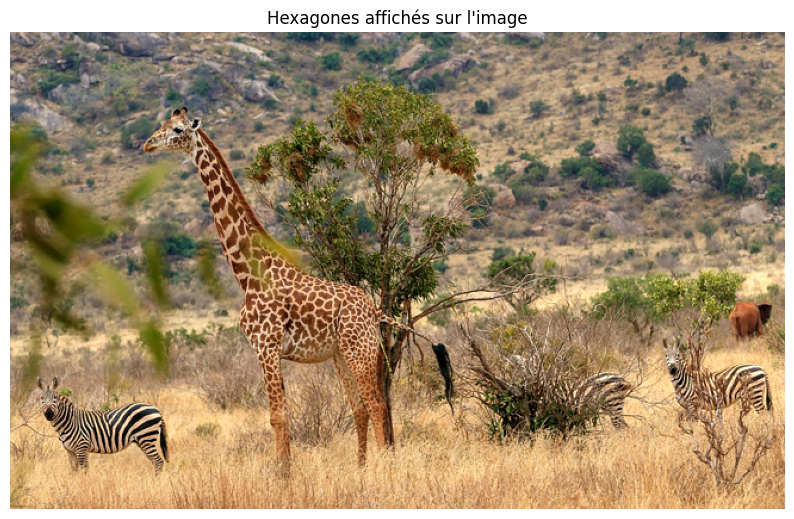

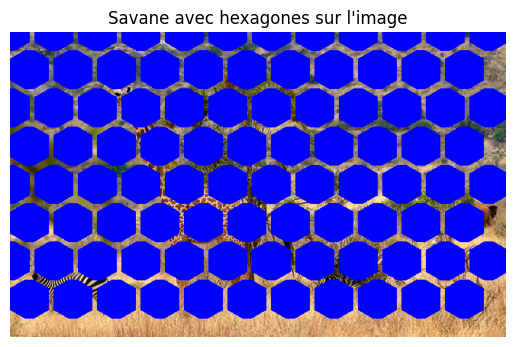

In [241]:
image = cv2.imread("savane.jpg")
image_with_hexagons = image.copy()
hexagones = zones_hexagones(image, 50)

plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image_with_hexagons, cv2.COLOR_BGR2RGB))  
plt.title("Hexagones affichés sur l'image")
plt.axis('off')
plt.show()

for i, hexa in enumerate(hexagones):
    for x, y in hexa:
        image_with_hexagons[y, x] = [255, 0, 0]

image_affiche = cv2.cvtColor(image_with_hexagons, cv2.COLOR_BGR2RGB)
plt.imshow(image_affiche)  
plt.title("Savane avec hexagones sur l'image")
plt.axis('off')
plt.show()




nombre de zones non vides 92 92


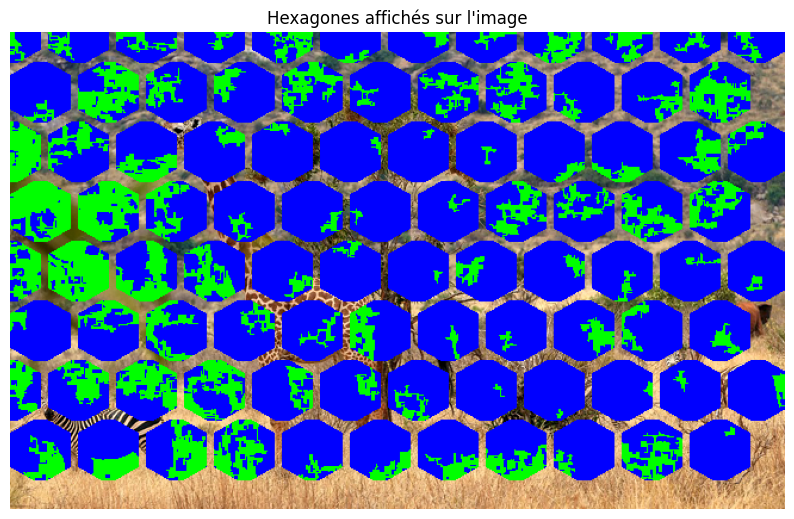

In [262]:
image = cv2.imread("savane.jpg")

hexagones = zones_hexagones(image, 50)
image_with_hexagons = image.copy()

for i, hexa in enumerate(hexagones):
    for x, y in hexa:
        image_with_hexagons[y, x] = [255, 0, 0]  
c=0
m =0
zone_final =[]
for hexa in hexagones :
    
    zones = zone_gradient_minimal(image, hexa)
    zone_final.append(zones)
    if len(zones) != 0 :
        c+=1
    m +=1
    for zone in zones :
        x,y = zone
        x, y = int(x), int(y) 
        if 0 <= y < image.shape[0] and 0 <= x < image.shape[1]:  
            image_with_hexagons[y, x] = [0, 255, 0]   
print("nombre de zones non vides" ,c,m)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image_with_hexagons, cv2.COLOR_BGR2RGB)) 
plt.title("Hexagones affichés sur l'image")
plt.axis('off')
plt.show()




Début du calcul des marqueurs...
Nombre d'hexagones : 92
nombre de zones non vides 92 92


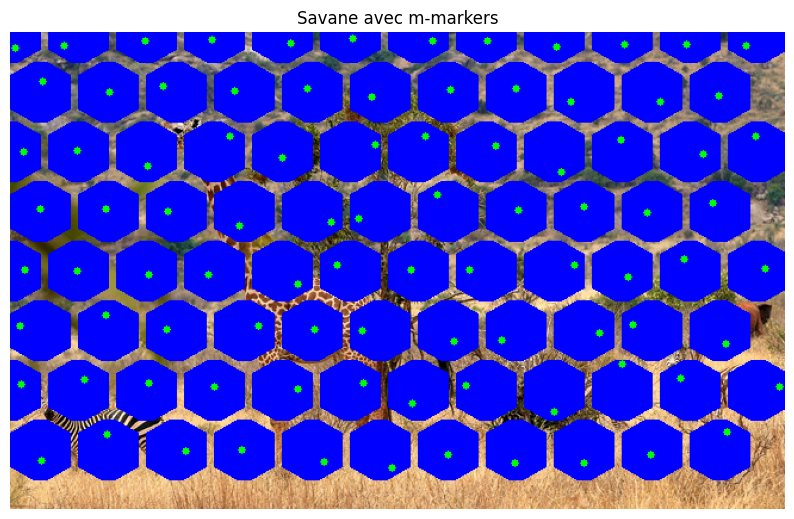

In [242]:
markers = m_markers_hexa(image, 50)

hexagones = zones_hexagones(image, 50)
image_with_hexagons = image.copy()

for i, hexa in enumerate(hexagones):
    for x, y in hexa:
        image_with_hexagons[y, x] = [255, 0, 0]  

for marker in markers :
    x = marker[0]
    y = marker[1]
    cv2.circle(image_with_hexagons, (x, y), radius=3, color=(0, 255, 0), thickness=-1)

print("nombre de zones non vides" ,c,m)
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image_with_hexagons, cv2.COLOR_BGR2RGB))  
plt.title("Savane avec m-markers")
plt.axis('off')
plt.show()

### Les points ci-dessus sont les nouveaux marqueurs à partir desquels on va aplliquer notre watershed.

In [ ]:
#test

import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import deque

def add_border_to_zone(image_with_hexagons, zone, border_size=3):
    for x, y in zone:
        for dx in range(-border_size, border_size + 1):
            for dy in range(-border_size, border_size + 1):
                nx, ny = x + dx, y + dy
                if 0 <= ny < image_with_hexagons.shape[0] and 0 <= nx < image_with_hexagons.shape[1]:
                    image_with_hexagons[ny, nx] = [0, 255, 0]  
    return image_with_hexagons

image = cv2.imread("village.jpg")

hexagones = zones_hexagones(image, 100) 
image_with_hexagons = image.copy()

for i, hexa in enumerate(hexagones):
    for x, y in hexa:
        image_with_hexagons[y, x] = [255, 0, 0]  

for i, hexa in enumerate(hexagones):
    zones = zone_gradient_minimal(image, hexa)


    if len(zones) > 0:
        image_with_hexagons = add_border_to_zone(image_with_hexagons, zones, border_size=3)


plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(image_with_hexagons, cv2.COLOR_BGR2RGB))  
plt.title("Zones de gradient minimal élargies")
plt.axis('off')
plt.show()

### On affiche nos waterpixels

Début du calcul des marqueurs...
Nombre d'hexagones : 136


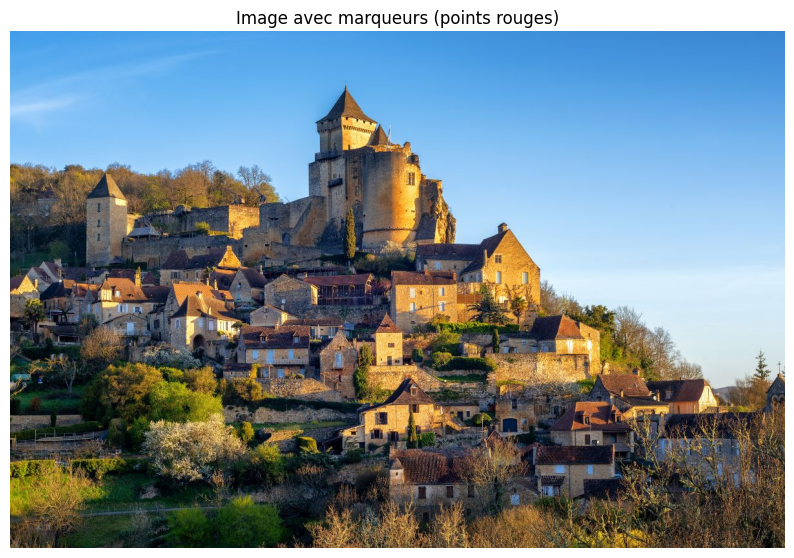

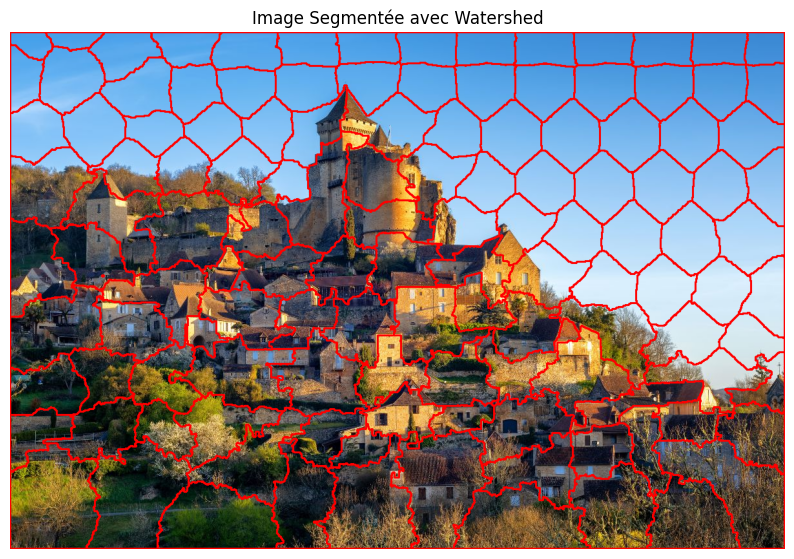

In [126]:
show_m_waterpixels(image, k=20, spacing=80, celltype=1, distance = distance_hex)


###

hexa
[(0, 0), (57, 0), (114, 0), (171, 0), (228, 0), (285, 0), (342, 0), (399, 0), (456, 0), (513, 0), (570, 0), (627, 0), (684, 0), (741, 0), (798, 0), (855, 0), (912, 0), (969, 0), (1026, 0), (1083, 0), (1140, 0), (1197, 0), (25, 50), (82, 50), (139, 50), (196, 50), (253, 50), (310, 50), (367, 50), (424, 50), (481, 50), (538, 50), (595, 50), (652, 50), (709, 50), (766, 50), (823, 50), (880, 50), (937, 50), (994, 50), (1051, 50), (1108, 50), (1165, 50), (0, 100), (57, 100), (114, 100), (171, 100), (228, 100), (285, 100), (342, 100), (399, 100), (456, 100), (513, 100), (570, 100), (627, 100), (684, 100), (741, 100), (798, 100), (855, 100), (912, 100), (969, 100), (1026, 100), (1083, 100), (1140, 100), (1197, 100), (25, 150), (82, 150), (139, 150), (196, 150), (253, 150), (310, 150), (367, 150), (424, 150), (481, 150), (538, 150), (595, 150), (652, 150), (709, 150), (766, 150), (823, 150), (880, 150), (937, 150), (994, 150), (1051, 150), (1108, 150), (1165, 150), (0, 200), (57, 200), (1

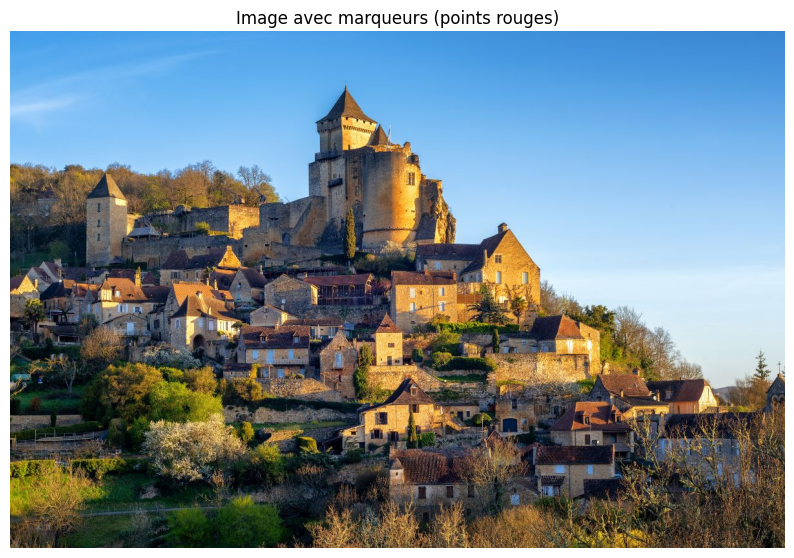

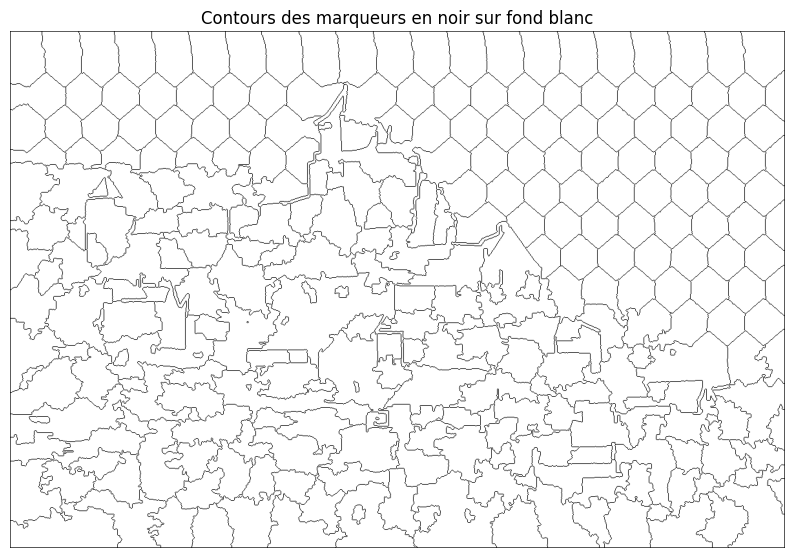

In [259]:
image = cv2.imread("village.jpg")

contours_c = waterpixels(image, k=6, spacing=50, celltype=0, type='hexa', distance=distance_hex)
contours_m = waterpixels(image, k=6, spacing=50, celltype=0, type='carre', distance=distance_hex)

print("c-water")
markers = waterpixels(image, k=8, spacing=50, celltype=1, type='hexa', distance=distance_hex)
print("m-water")
markers2 = m_waterpixels(image, k=8, spacing=50, celltype=0, distance=distance_inf)

border_image = contours(markers, image)
#border_image2 = contours(markers2, image)

### Ici on cherche à calculer quelle partie des contours obtenus par waterpixels sont proche des contours réels de l'image.

hexa
[(0, 0), (57, 0), (114, 0), (171, 0), (228, 0), (285, 0), (342, 0), (399, 0), (456, 0), (513, 0), (570, 0), (627, 0), (684, 0), (741, 0), (798, 0), (855, 0), (912, 0), (969, 0), (1026, 0), (1083, 0), (1140, 0), (1197, 0), (25, 50), (82, 50), (139, 50), (196, 50), (253, 50), (310, 50), (367, 50), (424, 50), (481, 50), (538, 50), (595, 50), (652, 50), (709, 50), (766, 50), (823, 50), (880, 50), (937, 50), (994, 50), (1051, 50), (1108, 50), (1165, 50), (0, 100), (57, 100), (114, 100), (171, 100), (228, 100), (285, 100), (342, 100), (399, 100), (456, 100), (513, 100), (570, 100), (627, 100), (684, 100), (741, 100), (798, 100), (855, 100), (912, 100), (969, 100), (1026, 100), (1083, 100), (1140, 100), (1197, 100), (25, 150), (82, 150), (139, 150), (196, 150), (253, 150), (310, 150), (367, 150), (424, 150), (481, 150), (538, 150), (595, 150), (652, 150), (709, 150), (766, 150), (823, 150), (880, 150), (937, 150), (994, 150), (1051, 150), (1108, 150), (1165, 150), (0, 200), (57, 200), (1

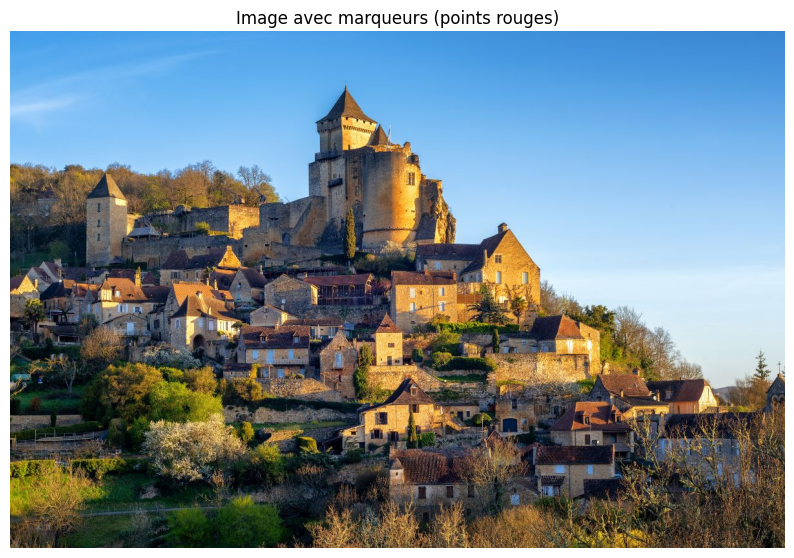

Pourcentage de correspondance pour les c-waterpixels : 87.19%
Pourcentage de correspondance pour les m-waterpixels : 85.83%


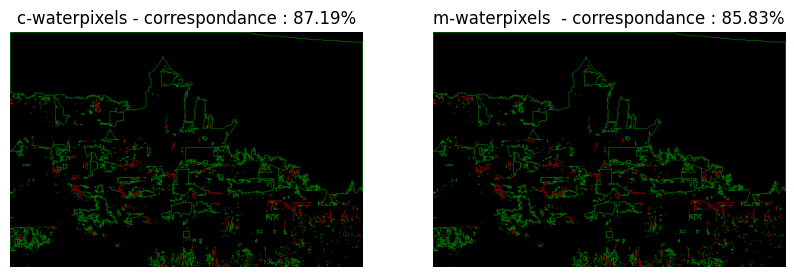

In [261]:
def normalize_contour(contour):
    if contour is None or len(contour) == 0:
        return None
    contour = np.array(contour, dtype=np.int32)
    if contour.ndim == 1:
        contour = contour.reshape((-1, 1, 2))  
    return contour

def match_and_draw_contours(image, contours1, contours2, color_match=(0, 255, 0), color_no_match=(0, 0, 255)):
    height, width = image.shape[:2]
    contour_image = np.zeros((height, width, 3), dtype=np.uint8)
    
    match_count = 0

    contours1 = [normalize_contour(c) for c in contours1 if c is not None and len(c) >= 3]
    contours2 = [normalize_contour(c) for c in contours2 if c is not None and len(c) >= 3]

    for c1 in contours1:
        matched = False
        for c2 in contours2:
            if c1 is not None and c2 is not None:  
                distance = cv2.matchShapes(c1, c2, cv2.CONTOURS_MATCH_I1, 0.0)
                if distance < 2:  
                    matched = True
                    match_count += 1
                    break
        
        color = color_match if matched else color_no_match
        if c1 is not None:
            cv2.drawContours(contour_image, [c1], -1, color, 1)
    
    match_percentage = (match_count / len(contours1)) * 100 if len(contours1) > 0 else 0
    
    return contour_image, match_percentage



image = cv2.imread("village.jpg")

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

_, binary = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)

contours_originaux, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

contours_c = waterpixels(image, k=6, spacing=50, celltype=0, type='hexa', distance=distance_hex)
contours_m = m_waterpixels(image, k=6, spacing=50, celltype=0, distance=distance_hex)

result_c, match_percentage_c = match_and_draw_contours(image, contours_originaux, contours_c)
result_m, match_percentage_m = match_and_draw_contours(image, contours_originaux, contours_m)

print(f"Pourcentage de correspondance pour les c-waterpixels : {match_percentage_c:.2f}%")
print(f"Pourcentage de correspondance pour les m-waterpixels : {match_percentage_m:.2f}%")

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(result_c, cv2.COLOR_BGR2RGB))
plt.title(f"c-waterpixels - correspondance : {match_percentage_c:.2f}%")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(result_m, cv2.COLOR_BGR2RGB))
plt.title(f"m-waterpixels  - correspondance : {match_percentage_m:.2f}%")
plt.axis('off')

plt.show()
